In [1]:
import numpy as np
import math
from matplotlib import pyplot as plt
from matplotlib import rcParams
import time
import fourierModel as ds
from copy import copy as dup
from scipy.integrate import odeint

In [2]:
# Graphics parameters
%matplotlib notebook
ticklabelsize = 15
fontsize = 15
linewidth = 2
fignum = 0

In [3]:
# Number of iterations to calculate Nliq from Ntot
niter = 1

# Message
print("Starting a new system")
nx = 512 # Number of points in simulation box
xmax = 50
x = np.linspace(0, xmax, nx)
boxpoints = len(x)
deltaX = x[1]-x[0]
Nbar = 1.0 # new Nbar from VMD, 260K
Nstar = .9/(2*np.pi)

# Initialize as a pre-equilibrated layer of liquid over ice
Nice = np.zeros(boxpoints)+1 # begin with one layer of ice
Fliq = ds.getNliq(Nice,Nstar,Nbar,niter) # initialize quasi-liquid layer

    

Starting a new system


<IPython.core.display.Javascript object>


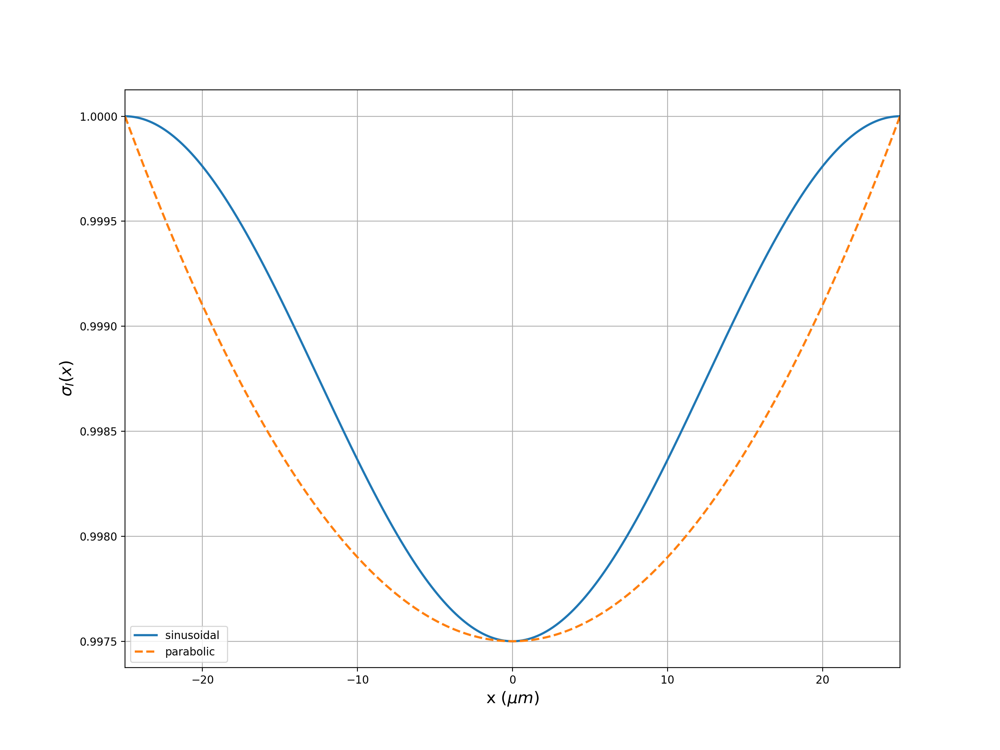

In [4]:
# Lay out the system
Ntot = Fliq + Nice     # add ice layers and quasi liquid layer to get total
nmid = int(nx/2)       # locate index of midpoint
nquart = int(nx/4)     # index of quarter point
xmid = max(x)/2        # x location of midpoint
xmax = x[nx-1]         # maximum x value
Nice_start = Nice[0]   # initial ice layer

# I'm not sure what this one does
Niceoffset = ds.getNiceoffset(Nbar, Nstar, 1, 0) # Old comment: Should be close to .75; not used if D=const   

# Just conversions
nmpermonolayer = 0.3 # nanometers per layer
umpersec_over_mlyperus = (nmpermonolayer/1e3*1e6) # not sure what this is

# Diffusion coefficient
D = 0.02e-2 # micrometers^2/microsecond

# Time steps
dtmaxtimefactor = 10 # duplicate line of code overwritten in next line?
dtmaxtimefactor = 50 # unsure what this is
dtmax = deltaX**2/D  # I think this is the step size to guarantee stability (no longer needed in Fourier?)
deltaT = dtmax/dtmaxtimefactor

# Deposition rate
nu_kin = 49 # microns/second
deprate = nu_kin/umpersec_over_mlyperus # monolayers per microsecond
deprate_times_deltaT = deprate * deltaT

# Supersaturation
sigma0 = 0.19 # I don't know exactly what this is
sigmastepmax = 0.20 # Value at edges(?), Must be bigger than sigma0 to get growth
center_reduction = 0.25 # How much lower the middle is, in percent
c_r = center_reduction/100

# Diffusion coefficient scaled for this time-step and space-step
DoverdeltaX2 = D/deltaX**2 # probably no longer needed in Fourier version

# Gets the function sigma(x) - higher deposition at the edges
sigmastep_sinusoid = ds.getsigmastep(x,xmax,center_reduction,sigmastepmax,method='sinusoid') # sinusoidal shape
sigmastep_parabolic = ds.getsigmastep(x,xmax,center_reduction,sigmastepmax,method='parabolic') # parabolic shape
sigmastepstyle = 'sinusoid'
if sigmastepstyle=='sinusoid':
    sigmastep = sigmastep_sinusoid
elif sigmastepstyle=='parabolic':
    sigmastep = sigmastep_parabolic
else:
    print('bad choice')

# Graph sigma(x)
fignum +=1
plt.figure(fignum)
plt.plot(x-xmid,sigmastep_sinusoid/sigmastepmax, \
         x-xmid, sigmastep_parabolic/sigmastepmax, '--',lw=linewidth)
plt.xlim([-xmid,xmid])
plt.legend(['sinusoidal ', 'parabolic'])
plt.xlabel(r'x ($\mu m$)',fontsize=fontsize)
plt.ylabel(r'$\sigma_I(x) $',fontsize=fontsize)
plt.grid('on')

In [18]:
# These are run control parameters

# Flag for explicit updating Fliq(Ntot) every step
updatingFliq = True # unsure if needed in Fourier model

# Set up a maximum number of iterations or layers
# I think for my vision of the Fourier approach, we won't need this
uselayers = True

# 1D run 
if uselayers:
    layermax_1D = 500
else:
    countermax_1D = 15000
    

In [19]:
# Reporting
print("D =", D, 'um^2/us',D * 1e-12*1e6*1e9, 'x 10^-9 m^2/sec') # diffusion
print('deltaT_max (Diffusion time)', dtmax) # diffusion time
print('deltaT =', deltaT) # timestep(?)
print('deprate =', deprate, 'monolayers/us') # deposition rate
print('nmid', nmid) # midpoint
print('N*', Nstar) # N^*
print('N*x2pi', Nstar*2*np.pi) # 2 pi N^*
print('Nbar, Nbar-N*, N*/Nbar', Nbar, Nbar-Nstar, Nstar/Nbar) # N average (what is N?) and deviation
print('deltaX', deltaX) # spatial step size
print('sigma_0 =', sigma0) # supersaturation default
print('sigmastepmax =', sigmastepmax) # deviation from default
print('center reduction', center_reduction, '%') # reduction of supersaturation in the center
print('max growth rate =', deprate*sigmastepmax*umpersec_over_mlyperus, 'um/sec') # max growth rate (edge)
print('min growth rate =', deprate*(sigmastepmax-sigma0)*umpersec_over_mlyperus, 'um/sec') # min growth rate (center)
print('nu_kin =', nu_kin, 'um/sec') # nu-kinetic

D = 0.0002 um^2/us 0.2 x 10^-9 m^2/sec
deltaT_max (Diffusion time) 47.87052745661972
deltaT = 0.9574105491323944
deprate = 0.16333333333333333 monolayers/us
nmid 256
N* 0.1432394487827058
N*x2pi 0.9
Nbar, Nbar-N*, N*/Nbar 1.0 0.8567605512172942 0.1432394487827058
deltaX 0.09784735812133072
sigma_0 = 0.19
sigmastepmax = 0.2
center reduction 0.25 %
max growth rate = 9.8 um/sec
min growth rate = 0.49000000000000044 um/sec
nu_kin = 49 um/sec


In [20]:
L = xmax/2; print(L) # half of spatial grid, micrometers
c_r = center_reduction / 100; print(c_r) # percent reduction in supersaturation in center, dimensionless
nu_kin_ml = deprate; print(nu_kin_ml) # deposition rate, monolayers per microsecond
sigma_I = sigmastepmax; print(sigma_I) # sigma at edge, dimensionless
print(D) # diffusion rate, micrometers^2/microsecond
M = np.array([.0027, .0025]) # not sure what this is
B = np.array([2.9, 1.59]) # not sure what this is
beta = np.array([0.65, 0.65]) # not sure what this is
xfactor = nu_kin_ml*L**2*c_r**beta*sigma_I/D # not sure what this is
NSS = M*xfactor + B # not sure what this is, but it's clearly something different for sine vs parabolic supersaturation profile
print('Nss predicted')
print('sinusoid:', NSS[0])
print('paraboloic:', NSS[1])

25.0
0.0025
0.16333333333333333
0.2
0.0002
Nss predicted
sinusoid: 8.510216387742963
paraboloic: 6.784644803465706


In [21]:
# This is the 1-d run

# Timing
sec1 = time.time()

# Bundle parameters for ODE solver
params = [Nbar, Nstar, niter, sigmastep, sigma0, deprate, DoverdeltaX2, nx]

# Initial conditions for ODE solver
y0 = list((Fliq,Ntot))
ylast = dup(y0)

# Time steps
t0 = 0.0
tlast = dup(t0)
ttot = 0.0
tinterval = [t0, deltaT]

# Initialize the keeper arrays
tkeep = [t0]
Nicekeep = [dup(Nice)]
Ntotkeep = [dup(Ntot)]
Fliqkeep = [dup(Fliq)]
fluxderivskeep = []

# Call the ODE solver
Nice0_start = Nice[0] # initial ice layer
Nice0 = Nice[0] # current ice layer
Ntot0_start = Ntot[0] # initial total layers
Ntot0 = Ntot[0] # total layers
updatingFliq = True # not sure what this does
counter = 0 # current timestep
lastlayer = 0 # last layer of liquid
lastdiff = 0 # maximum difference between edge and center

while True:
    
    # Integrate up to next time step
    y = odeint(ds.f1d, np.reshape(ylast,2*nx), tinterval, args=(params,),rtol=1e-12)
    
    # reshape output into total and liquid
    ylast = np.reshape(y[1],(2,nx))
    
    # increment timestep
    tlast += deltaT
    
    # increment timestep counter
    counter += 1
        
    # Make some local copies, with possible updates to Fliq
    Fliq, Ntot = ylast
    if updatingFliq:
        Fliq = ds.getNliq(Ntot,Nstar,Nbar,niter) # This updates to remove any drift
        ylast[0] = Fliq
    Nice = Ntot - Fliq
    Nice0 = Nice[0]
    Ntot0 = Ntot[0]
    ttot += deltaT
    
    # Save into keeper arrays
    Nicekeep.append(Nice)
    Ntotkeep.append(Ntot)
    Fliqkeep.append(Fliq)
    tkeep.append(ttot)
    
    # Update counters and see whether to break
    layer = Ntot0-Ntot0_start
    if (layer-lastlayer) > 0:
        minpoint = min(Nice)
        maxpoint = max(Nice)
        print(counter-1, lastlayer, maxpoint-minpoint, maxpoint-minpoint-lastdiff)
        lastdiff = maxpoint-minpoint
        lastlayer += 1
    if uselayers:
        if layer > layermax_1D-1:
            print('breaking because reached max number of layers')
            break
    else:
        if counter > countermax_1D-1:
            print('breaking because reached max number of iterations')
            break
            
            
sec2 = time.time()

0 0 1.5057804115218971 1.5057804115218971
165 1 1.5071787690691565 0.0013983575472593657
330 2 1.5107222878614266 0.003543518792270106
495 3 1.548967017535233 0.03824472967380643
660 4 1.693720326379207 0.14475330884397408
825 5 1.8857571277869454 0.19203680140773827
991 6 2.0288743056592438 0.14311717787229838
1156 7 2.125430990673877 0.0965566850146331
1321 8 2.185839447512464 0.0604084568385872
1486 9 2.225135364360426 0.039295916847962076
1651 10 2.2518034939857614 0.02666812962533527
1817 11 2.2941773415987825 0.0423738476130211
1982 12 2.308191691827858 0.01401435022907549
2147 13 2.318416745466905 0.010225053639047132
2312 14 2.326005799419491 0.0075890539525858
2477 15 2.3317153374106994 0.005709537991208435
2643 16 2.362316049525532 0.030600712114832618
2808 17 2.365349489822094 0.003033440296562162
2973 18 2.367603563889759 0.0022540740676646465
3138 19 2.3692879817618575 0.0016844178720987202
3303 20 2.3705636496703306 0.0012756679084731104
3469 21 2.398481572579712 0.027917

28089 170 6.394135626838278 0.0036701496417208546
28255 171 6.395564123090935 0.0014284962526573963
28421 172 6.39497017378207 -0.0005939493088646941
28587 173 6.392569516853911 -0.0024006569281596057
28754 174 6.417468990360163 0.024899473506252434
28920 175 6.411073986446922 -0.006395003913240771
29086 176 6.403388047321187 -0.007685939125735786
29253 177 6.422958449348386 0.019570402027198952
29419 178 6.411946551937774 -0.011011897410611482
29586 179 6.428368340787699 0.01642178884992518
29753 180 6.443790517424219 0.01542217663651968
29919 181 6.427884568698431 -0.015905948725787766
30086 182 6.440052840142243 0.012168271443812273
30253 183 6.451035710917836 0.010982870775592346
30420 184 6.460769818022584 0.009734107104748091
30586 185 6.439741301914211 -0.021028516108373196
30753 186 6.446645149342231 0.006903847428020526
30920 187 6.452377491208182 0.00573234186595073
31087 188 6.45694220171427 0.004564710506087977
31254 189 6.460347282231879 0.003405080517609349
31422 190 6.49

56228 337 7.456176828141793 0.01478865881438196
56397 338 7.440951931261964 -0.015224896879828975
56567 339 7.455403944863747 0.014452013601783165
56736 340 7.440031209659708 -0.015372735204039145
56906 341 7.454132319826101 0.014101110166393482
57075 342 7.438650471125754 -0.015481848700346745
57245 343 7.452388398044889 0.013737926919134225
57415 344 7.466691747776565 0.014303349731676462
57584 345 7.450199992771047 -0.016491755005517916
57754 346 7.464107389848891 0.013907397077844053
57923 347 7.447596006678452 -0.016511383170438876
58093 348 7.461099365519658 0.013503358841205682
58262 349 7.4446061580321725 -0.016493207487485506
58432 350 7.457699127107503 0.01309296907533053
58602 351 7.471298815842374 0.013599688734871052
58771 352 7.453938622485623 -0.017360193356751097
58941 353 7.4671026339242985 0.013164011438675516
59110 354 7.449850036012549 -0.01725259791174949
59280 355 7.462575613437423 0.01272557742487379
59449 356 7.445465543342323 -0.017110070095100127
59619 357 7.4

Height of Ice 560.0220223087329
1-D growth, corner 498.82790455811966
1-D growth, center 493.05823889060963
1-D Modeled growth rate, corner, um/s 1.867023370073402
1-D Modeled growth rate, corner, ml/us 0.006223411233578007
1-D Modeled growth rate, center, um/s 1.8454285464071243
1-D Modeled alpha, corner 0.19051287675795758
1-D Modeled alpha, center 0.1887809833464428
Difference, % -0.9090689516568013
Libbrecht's predicted growth rate, um/s 1.8393582063217946
Libbrecht's predicted alpha 0.18768961288997904
Time taken: 41 min 18.120916843414307 secs


<IPython.core.display.Javascript object>


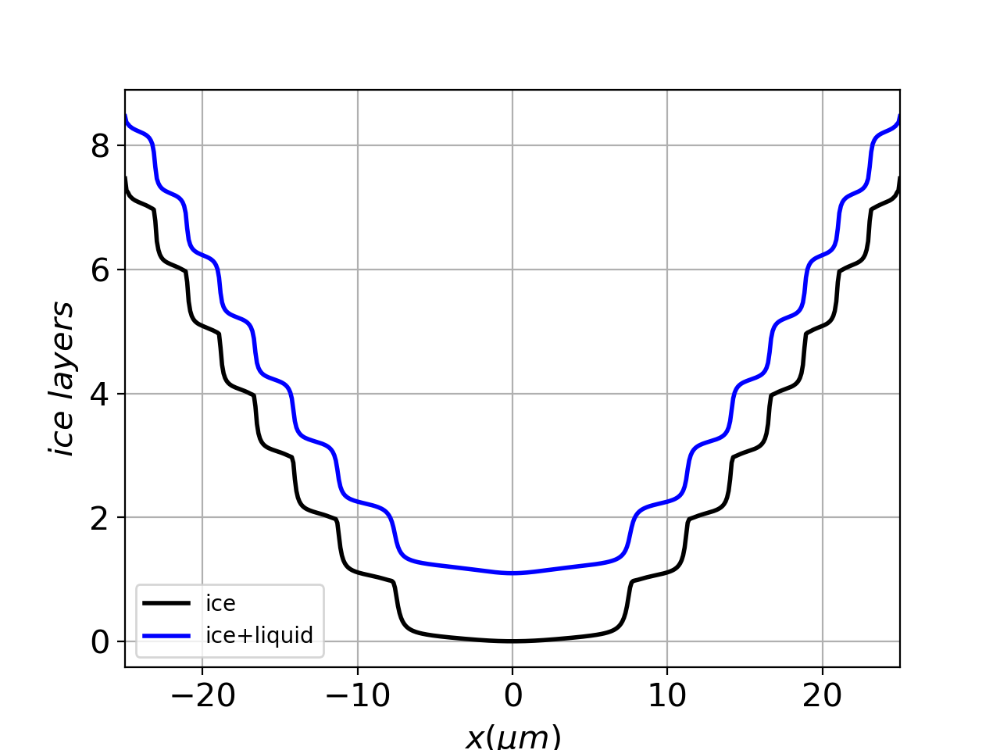

<IPython.core.display.Javascript object>


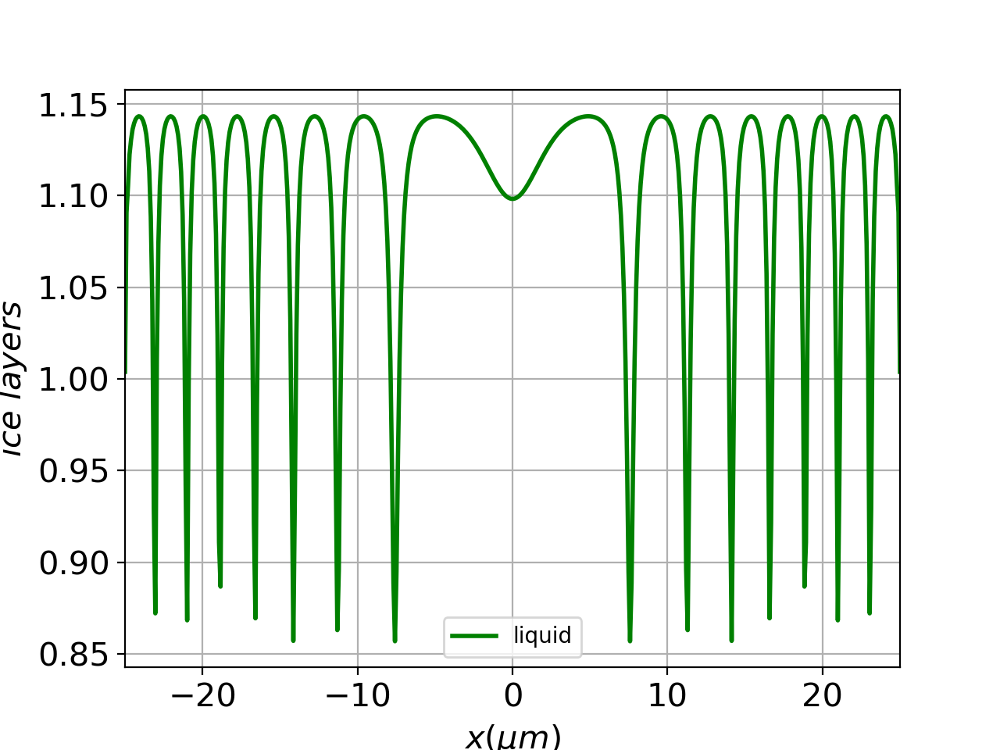

<IPython.core.display.Javascript object>


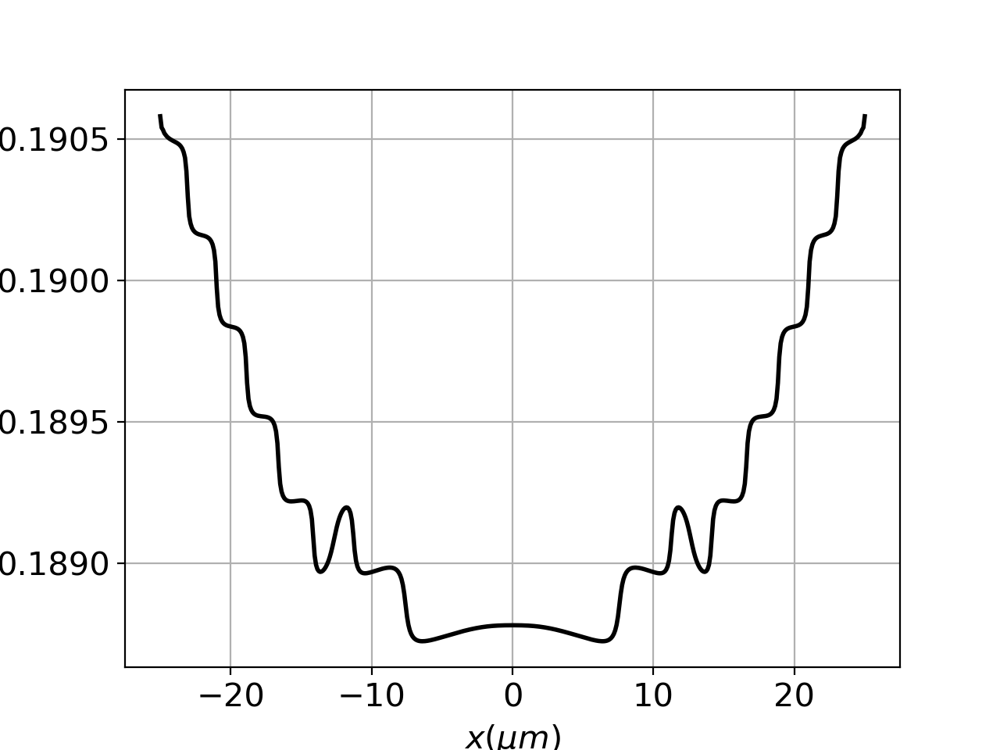

In [22]:
# Growth statistics
minpoint = min(Nice)
ncorner = 4 # why is ncorner 4 and not 0?

# total height of ice
print("Height of Ice", minpoint)

 # change in total ice depth at each grid point
delta_Ntot_entire = Ntot-Ntotkeep[0]

# growth at corner and in center
print( "1-D growth, corner", delta_Ntot_entire[ncorner])
print( "1-D growth, center", delta_Ntot_entire[nmid])

# growth over time (growth rate)
growthrate_entire = delta_Ntot_entire/ttot*umpersec_over_mlyperus
print( "1-D Modeled growth rate, corner, um/s", growthrate_entire[ncorner])
print( "1-D Modeled growth rate, corner, ml/us", growthrate_entire[ncorner]/umpersec_over_mlyperus) # why different units on this one?
print( "1-D Modeled growth rate, center, um/s", growthrate_entire[nmid])

# alpha is some other modified growth rate
alpha = growthrate_entire/nu_kin/sigmastep
print( "1-D Modeled alpha, corner", alpha[ncorner])
print( "1-D Modeled alpha, center", alpha[nmid])
print( "Difference, %", (alpha[nmid]-alpha[ncorner])/alpha[ncorner]*100)

# Comparisons with Libbrecht
sigma0_L = 0.08
A_L = .28
alpha_L = A_L*np.exp(-sigma0_L/sigmastepmax)
print("Libbrecht's predicted growth rate, um/s", nu_kin*alpha_L*sigmastepmax)
print("Libbrecht's predicted alpha", alpha_L)

# Timing statistics
print("Time taken:", int((sec2-sec1)/60), "min", (sec2-sec1)%60, "secs")

#########
# Plots #
#########

# First plot: layers (rescaled to have minimum at zero, shifted so center of facet is at zero)
fignum +=1
plt.figure(fignum)
plt.plot(x-xmid, Nice-minpoint, 'k', label='ice', lw=linewidth)
plt.plot(x-xmid, Fliq+Nice-minpoint, 'b', label='ice+liquid', lw=linewidth)
plt.xlabel(r'$x (\mu m$)',fontsize=fontsize)
plt.ylabel(r'$ice \ layers$',fontsize=fontsize)
plt.xlim([-xmid, xmid])
rcParams['xtick.labelsize'] = ticklabelsize 
rcParams['ytick.labelsize'] = ticklabelsize
plt.legend()
plt.grid('on')

# Second plot: liquid layer alone
fignum +=1
plt.figure(fignum)
plt.plot(x-xmid, Fliq, 'g', label='liquid', lw=linewidth)
plt.xlabel(r'$x (\mu m$)',fontsize=fontsize)
plt.ylabel(r'$ice \ layers$',fontsize=fontsize)
plt.xlim([-xmid, xmid])
rcParams['xtick.labelsize'] = ticklabelsize 
rcParams['ytick.labelsize'] = ticklabelsize
plt.legend()
plt.grid('on')

# Third plot: alpha (a measure of growth rate at each point)
fignum +=1
plt.figure(fignum)
plt.plot(x-xmid, alpha, 'k', lw=linewidth)
plt.xlabel(r'$x (\mu m$)',fontsize=fontsize)
plt.ylabel(r'$ \alpha $',fontsize=fontsize)
rcParams['xtick.labelsize'] = ticklabelsize 
rcParams['ytick.labelsize'] = ticklabelsize
plt.grid('on')


In [ ]:
fignum = 9
plt.figure(fignum)
plt.semilogy(np.abs(np.fft.fft(ylast[0,])[0:250]))
plt.semilogy(np.abs(np.fft.fft(ylast[1,])[0:250]))
plt.title("Magnitude of Fourier modes at 100 Layers (log scale)")
plt.xlabel("Wavenumber")
plt.ylabel("Magnitude")
plt.legend(["Total Depth","QLL Depth"])

<IPython.core.display.Javascript object>


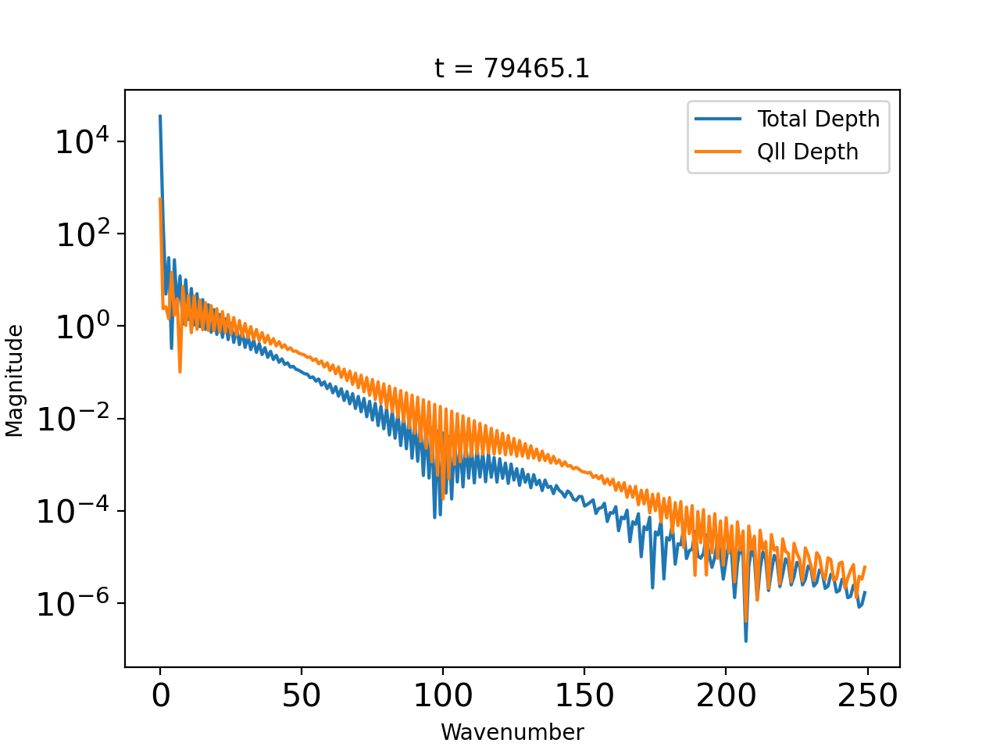

In [40]:
fignum = 9
plt.figure(fignum)
plt.semilogy(np.abs(np.fft.fft(Ntotkeep[0])[0:250]))
plt.semilogy(np.abs(np.fft.fft(Fliqkeep[0])[0:250]))
plt.title("Magnitude of Fourier modes at 100 Layers (log scale)")
plt.xlabel("Wavenumber")
plt.ylabel("Magnitude")
plt.legend(["Total Depth","QLL Depth"])

In [70]:
Fliqkeep.shape

AttributeError: 'list' object has no attribute 'shape'

<IPython.core.display.Javascript object>


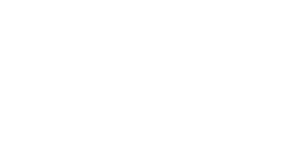

In [73]:
# make animation of the Fourier frequency spectrum over time

from matplotlib import animation
from IPython.display import HTML



Ntotanim = Ntotkeep[0::1000]
Fliqanim = Fliqkeep[0::1000]
tanim = tkeep[0::1000]

# initialize figure
myFig = plt.figure()
ax = plt.subplot()
ax.axis(xmin = 0,xmax = 250,ymin = -20, ymax = 10)
    
# create empty list of lines to populate each iteration
lineList = [ax.plot([],[]) for i in range(2)]

legendList = ["Total Depth","Qll Depth"]

# define function to draw each frame
def makeFrame(n):
    lineList[0][0].set_data(np.arange(0,250),np.log(np.abs(np.fft.fft(Ntotanim[n])[0:250])))
    lineList[1][0].set_data(np.arange(0,250),np.log(np.abs(np.fft.fft(Fliqanim[n])[0:250])))
    plt.title('t = '+str(round(tanim[n],1)))
    plt.legend(legendList, loc = "upper right")
    return lineList

# generate animation
anim = animation.FuncAnimation(fig = myFig,func = makeFrame,frames = len(tanim))

plt.close()
HTML(anim.to_jshtml())

<IPython.core.display.Javascript object>


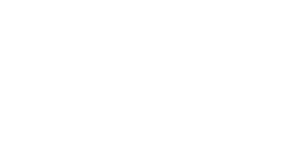

In [85]:
# animation of facet depth over time

from matplotlib import animation
from IPython.display import HTML



Ntotanim = Ntotkeep[0::1000]
Niceanim = Nicekeep[0::1000]
Fliqanim = Fliqkeep[0::1000]
tanim = tkeep[0::1000]

# initialize figure
myFig = plt.figure()
ax = plt.subplot()
ax.axis(xmin = min(x-xmid),xmax = max(x-xmid),ymin = 0, ymax = 10)
# create empty list of lines to populate each iteration
lineList = [ax.plot([],[]) for i in range(2)]

legendList = ["Total Depth","Qll Depth"]

# define function to draw each frame
def makeFrame(n):
    lineList[0][0].set_data(x-xmid,Niceanim[n]-min(Niceanim[n]))
    lineList[1][0].set_data(x-xmid,Fliqanim[n]+Niceanim[n]-min(Niceanim[n]))
    plt.title('t = '+str(round(tanim[n],1)))
    plt.legend(legendList, loc = "upper right")
    return lineList

# generate animation
anim = animation.FuncAnimation(fig = myFig,func = makeFrame,frames = len(tanim))

plt.close()
HTML(anim.to_jshtml())



In [81]:
Niceanim[1]

array([74.81779544, 74.8170516 , 74.81531414, 74.81252037, 74.8086132 ,
       74.80356146, 74.79734162, 74.78993339, 74.78131987, 74.7714902 ,
       74.76044289, 74.74818921, 74.7347563 , 74.72018969, 74.70455497,
       74.68793831, 74.67044569, 74.65220073, 74.63334142, 74.61401569,
       74.59437658, 74.57457707, 74.5547652 , 74.53507986, 74.51564732,
       74.4965788 , 74.47796903, 74.45989579, 74.44242012, 74.42558732,
       74.40942824, 74.39396093, 74.37919239, 74.3651203 , 74.35173479,
       74.3390199 , 74.32695504, 74.3155162 , 74.30467697, 74.29440943,
       74.28468485, 74.27547426, 74.2667489 , 74.25848057, 74.25064187,
       74.24320643, 74.23614896, 74.22944538, 74.22307285, 74.2170098 ,
       74.21123586, 74.20573191, 74.20047996, 74.19546317, 74.19066577,
       74.186073  , 74.18167104, 74.17744699, 74.17338878, 74.1694851 ,
       74.1657254 , 74.16209979, 74.158599  , 74.15521436, 74.15193771,
       74.1487614 , 74.14567821, 74.14268137, 74.13976445, 74.13